In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping
import tensorflow as tf
from tensorflow.keras import backend as K


def poisson_loss(y_true, y_pred):
    # Cast the data types to avoid type mismatches
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    # Ensure that predictions are not exactly zero to avoid log(0) issues
    y_pred = K.clip(y_pred, K.epsilon(), None)

    # Calculate the Poisson loss
    loss = y_pred - y_true * K.log(y_pred + K.epsilon())

    # Take the mean over all examples in the batch
    return K.mean(loss, axis=-1)



In [2]:
df = pd.read_csv('CleanedData.csv')

In [3]:
#df1 = df
df.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,day_count
0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,4.680365,...,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593,1.0
1,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,4.913725,...,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711,1.0
2,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,4.393365,...,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500,1.0
3,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,4.404896,...,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200,1.0
4,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,4.682836,...,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505,1.0


In [4]:
df.tail()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,day_count
35098,11.0,346.0,0.529052,1.0,0.684783,9.0,7.0,1.0,1.0,4.523121,...,0.75,-0.260000,-0.5,-0.125000,0.100000,0.000000,0.400000,0.000000,1800,3.0
35099,12.0,328.0,0.696296,1.0,0.885057,9.0,7.0,3.0,48.0,4.405488,...,0.70,-0.211111,-0.4,-0.100000,0.300000,1.000000,0.200000,1.000000,1900,3.0
35100,10.0,442.0,0.516355,1.0,0.644128,24.0,1.0,12.0,1.0,5.076923,...,0.50,-0.356439,-0.8,-0.166667,0.454545,0.136364,0.045455,0.136364,1900,3.0
35101,6.0,682.0,0.539493,1.0,0.692661,10.0,1.0,1.0,0.0,4.975073,...,0.50,-0.205246,-0.5,-0.012500,0.000000,0.000000,0.500000,0.000000,1100,3.0
35102,10.0,157.0,0.701987,1.0,0.846154,1.0,1.0,0.0,2.0,4.471338,...,0.50,-0.200000,-0.2,-0.200000,0.333333,0.250000,0.166667,0.250000,1300,3.0


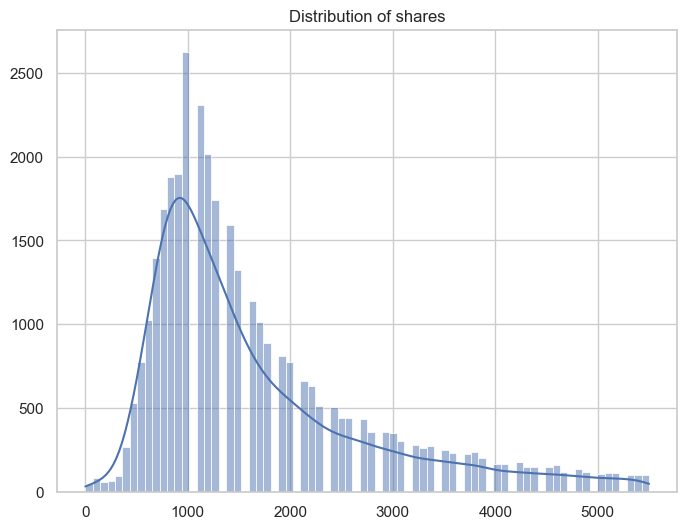

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame

# Set the style for the plots
sns.set(style="whitegrid")

# Set up the subplot
fig, ax = plt.subplots(figsize=(8, 6))

# Choose the second last column (assuming at least two columns are present)
column_to_plot = df.columns[51]

# Plot the distribution of the selected column
sns.histplot(df[column_to_plot], kde=True, ax=ax)
ax.set_title(f'Distribution of {column_to_plot}')
ax.set_xlabel('')
ax.set_ylabel('')

# Show the plot
plt.show()



In [6]:
import seaborn as sns
fig = plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(pd.DataFrame(df).corr(), annot = True, fmt = '.2f')

<Axes: >

In [7]:
c = ['kw_min_min', 'kw_max_min', 'kw_avg_min', 'kw_min_max', 'kw_max_max', 'avg_negative_polarity', 'avg_positive_polarity', 'self_reference_avg_sharess', 'n_unique_tokens', 'n_non_stop_words', 'num_self_hrefs', 'title_subjectivity', 'max_negative_polarity', 'min_negative_polarity', 'max_positive_polarity', 'min_positive_polarity', 'abs_title_subjectivity','rate_negative_words','LDA_02', 'LDA_00', 'LDA_04', 'rate_positive_words', 'abs_title_sentiment_polarity']

In [8]:
df.drop(c,inplace=True, axis=1)

In [9]:
import seaborn as sns
fig = plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(pd.DataFrame(df).corr(), annot = True, fmt = '.2f')

<Axes: >

In [6]:
#scaler = StandardScaler()
#scaler1 = StandardScaler()
#df = scaler.fit_transform(df) 

y = df['shares']
X = df.drop('shares', axis=1)
#y = scaler.fit_transform(y) 
#X = scaler1.fit_transform(X)
print(X.shape, y.shape)

(35103, 52) (35103,)


In [7]:
min_max_scaler = StandardScaler()
min_max_scaler1 = MinMaxScaler()
X = np.array(X)
y = np.array(y)
y = np.log1p(y)
#X = min_max_scaler.fit_transform(X)
#y = y.reshape(-1, 1)
#y = min_max_scaler1.fit_transform(y)

In [11]:
print(y)

[6.38687932 6.56807791 7.31388683 ... 7.55013534 7.00397414 7.17088848]


In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=350)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(28082, 29) (7021, 29) (28082,) (7021,)


In [13]:
#min_max_scaler = MinMaxScaler()
X_train = min_max_scaler.fit_transform(X_train)
X_test = min_max_scaler.transform(X_test)


In [42]:
#model = Sequential()
#model.add(Dense(2000, input_shape=(X_train.shape[1],), activation='relu'))
#model.add(Dense(1000, activation='relu'))
#model.add(Dense(500, activation='relu'))
#model.add(Dense(1, activation='linear')) 
#model.summary()

In [15]:
model = Sequential()
model.add(Dense(512, input_shape=(X_train.shape[1],), activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(1, activation='exponential'))

model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 512)               15360     
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 256)               131328    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 256)               65792     
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                                 
 dense_8 (Dense)             (None, 256)              

In [16]:
from keras.callbacks import ModelCheckpoint
def mape_metric(y_true, y_pred):
    return tf.reduce_mean(tf.abs((y_true - y_pred) / y_true)) * 100
# Compile the model with the custom Poisson loss
model.compile(optimizer='adam', loss='poisson', metrics=['mse', mape_metric])
es = EarlyStopping(monitor='val_loss',mode='min', patience=50,restore_best_weights = True)
checkpoint = ModelCheckpoint('best_weights.h5', save_best_only=True, monitor='val_loss', mode='min', verbose=1)
model.fit(X_train, y_train, validation_data = (X_test, y_test), epochs=200, batch_size=32, verbose=2, callbacks=[checkpoint])


Epoch 1/200



Epoch 1: val_loss improved from inf to -5.01235, saving model to best_weights.h5
878/878 - 7s - loss: 74.8647 - mse: 173522464.0000 - mape_metric: 1027.4164 - val_loss: -5.0123e+00 - val_mse: 17.6518 - val_mape_metric: 56.9054 - 7s/epoch - 8ms/step
Epoch 2/200


C:\Users\tanis\anaconda3\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from -5.01235 to -5.22453, saving model to best_weights.h5
878/878 - 5s - loss: -6.5815e+00 - mse: 9.2609 - mape_metric: 29.3759 - val_loss: -5.2245e+00 - val_mse: 16.4220 - val_mape_metric: 55.0760 - 5s/epoch - 6ms/step
Epoch 3/200

Epoch 3: val_loss improved from -5.22453 to -6.14797, saving model to best_weights.h5
878/878 - 5s - loss: -6.7557e+00 - mse: 6.4961 - mape_metric: 24.0114 - val_loss: -6.1480e+00 - val_mse: 9.7065 - val_mape_metric: 41.8265 - 5s/epoch - 6ms/step
Epoch 4/200

Epoch 4: val_loss improved from -6.14797 to -6.75470, saving model to best_weights.h5
878/878 - 5s - loss: -6.9008e+00 - mse: 2.9328 - mape_metric: 18.4816 - val_loss: -6.7547e+00 - val_mse: 4.0512 - val_mape_metric: 26.1289 - 5s/epoch - 6ms/step
Epoch 5/200

Epoch 5: val_loss improved from -6.75470 to -6.82270, saving model to best_weights.h5
878/878 - 5s - loss: -6.9580e+00 - mse: 2.1203 - mape_metric: 15.7110 - val_loss: -6.8227e+00 - val_mse: 3.3167 - val_mape_metric: 2

In [20]:
weights = model.get_weights()

In [21]:
print(weights)

[array([[ 0.2776851 , -0.7412315 ,  0.14408813, ...,  0.08486002,
        -0.23432669,  0.1576749 ],
       [ 0.723787  ,  0.26227573,  0.14889395, ...,  0.00763652,
         0.30547696, -0.00299602],
       [-0.7714116 ,  0.18214732,  0.10668306, ...,  0.22221497,
        -0.07765996, -0.17096867],
       ...,
       [ 0.10410124,  0.315269  ,  0.30239874, ...,  0.37497005,
         0.18560424,  0.17766929],
       [-0.20278887, -0.4879868 ,  0.08916746, ..., -0.31954888,
         0.24458113, -0.14580289],
       [ 0.01337516, -0.29757816,  0.16476135, ..., -0.38530967,
         0.17019351, -0.24184497]], dtype=float32), array([-0.04590177, -0.04781332, -0.85607445, -0.13177875, -1.0558769 ,
       -0.31987077, -0.20161355, -0.33332708, -0.5505328 , -0.8741421 ,
       -0.5870852 , -0.3902191 , -0.01702256, -0.18527567, -0.2990229 ,
        0.00315502, -0.8870767 , -0.9908593 , -0.14371729, -0.7078161 ,
       -0.5043743 , -0.71068335, -0.4200764 , -0.3148375 ,  0.00331708,
        0.

In [1]:
predictions = model.predict(X_test)

NameError: name 'model' is not defined

In [23]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

mse = mean_squared_error(y_test, predictions)
mae = mean_absolute_error(y_test, predictions)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")

Mean Squared Error: 0.342306561277042
Mean Absolute Error: 0.4570760939536434


In [24]:
# Number of bootstrap samples
num_bootstrap_samples = 1000

# Collect original MSE
original_model = model
original_mse = mean_squared_error(y_test, original_model.predict(X_test))

# Initialize an array to store p-values for each feature
p_values = []

# Loop through each feature for hypothesis testing
for feature_index in range(X_train.shape[1]):
    feature_values = X_train[:, feature_index]

    mse_differences = []

    # Bootstrap sampling for the current feature
    for _ in range(num_bootstrap_samples):
        values_bootstrap = np.random.choice(feature_values, len(feature_values), replace=True)

        # Create and train a neural network for each bootstrap sample
        model_bootstrap = train_and_evaluate_model(X_train, y_train, X_test, y_test, feature_values=values_bootstrap)

        # Evaluate the model and collect mean squared error
        mse_bootstrap = mean_squared_error(y_test, model_bootstrap.predict(X_test))

        mse_differences.append(mse_bootstrap)

    # Perform statistical analysis (e.g., calculate p-value) for the current feature
    p_value = calculate_p_value(original_mse, mse_differences)
    p_values.append(p_value)

# Adjust the p-values for multiple testing (e.g., Bonferroni correction) if needed
# Perform further analysis based on the obtained p-values



NameError: name 'train_and_evaluate_model' is not defined

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 512)               15360     
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 256)               131328    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 256)               65792     
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                                 
 dense_8 (Dense)             (None, 256)              

In [16]:
# Bootstrap hypothesis testing 1

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.utils import resample
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
from tqdm import tqdm

# Define the number of bootstrap samples
num_bootstraps = 1000

# Store the performance metric (e.g., accuracy) for each bootstrap sample
bootstrap_metrics = []
bootstrap_mse = []

np.random.seed(35)

num_samples = int(len(df) / 3)

df = df.sample(n=num_samples, random_state=42)

y = df['shares']
cc = ['shares', 'data_channel_is_lifestyle', 'data_channel_is_entertainment', 'data_channel_is_bus', 'data_channel_is_socmed', 'data_channel_is_tech', 'data_channel_is_world']
X = df.drop(cc, axis=1)

print(X.shape, y.shape)
X = np.array(X)
y = np.array(y)
y = np.log1p(y)
X_train = min_max_scaler.fit_transform(X_train)
X_test = min_max_scaler.transform(X_test)



model1 = Sequential()
model1.add(Dense(512, input_shape=(X_train.shape[1],), activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(256, activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(256, activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(256, activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(256, activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(1, activation='exponential'))
    
model1.compile(optimizer='adam', loss='poisson', metrics=['mse'])

model2 = model1

for _ in range(num_bootstraps):
    # Create a bootstrap sample
    X_bootstrap, y_bootstrap = resample(X_train, y_train, random_state=np.random.randint(1, 1000), replace=True)

    # Train your neural network on the bootstrap sample
    early_stopping = EarlyStopping(monitor='val_loss', patience=25, restore_best_weights=True)
    model2.fit(X_bootstrap, y_bootstrap, epochs=100, validation_data=(X_test, y_test),  verbose=2, batch_size=110, callbacks=[early_stopping])

    # Make predictions on the test set
    y_pred = model1.predict(X_test)

    # Calculate the performance metric (e.g., accuracy) for this bootstrap sample
    mse1 = mean_squared_error(y_test, y_pred)
    bootstrap_mse.append(mse1)
    print(mse1)

# Calculate the confidence interval for the performance metric


# Print the results
print(bootstrap_mse)


(3900, 46) (3900,)
Epoch 1/100


KeyboardInterrupt: 

In [69]:
model3 = model1

In [73]:
model1 = Sequential()
model1.add(Dense(256, input_shape=(X_train.shape[1],), activation='relu'))
model1.add(Dropout(0.1))
model1.add(Dense(128, activation='relu'))
model1.add(Dropout(0.1))
model1.add(Dense(128, activation='relu'))
model1.add(Dropout(0.1))
model1.add(Dense(128, activation='relu'))
model1.add(Dropout(0.1))
model1.add(Dense(1, activation='exponential'))
    
model1.compile(optimizer='adam', loss='poisson', metrics=['mse'])


early_stopping = EarlyStopping(monitor='val_loss', patience=25, restore_best_weights=True)
model1.fit(X_train, y_train, epochs=100, validation_data=(X_test, y_test),  verbose=2, batch_size=110, callbacks=[early_stopping])

Epoch 1/100
256/256 - 2s - loss: 48.9862 - mse: 85719968.0000 - val_loss: -6.9208e+00 - val_mse: 2.1253 - 2s/epoch - 6ms/step
Epoch 2/100
256/256 - 1s - loss: -6.8948e+00 - mse: 3.3982 - val_loss: -6.9921e+00 - val_mse: 1.2981 - 802ms/epoch - 3ms/step
Epoch 3/100
256/256 - 1s - loss: -6.9672e+00 - mse: 2.0031 - val_loss: -6.9528e+00 - val_mse: 1.8026 - 797ms/epoch - 3ms/step
Epoch 4/100
256/256 - 1s - loss: -6.9971e+00 - mse: 1.5372 - val_loss: -7.0103e+00 - val_mse: 1.0909 - 782ms/epoch - 3ms/step
Epoch 5/100
256/256 - 1s - loss: -7.0154e+00 - mse: 1.2450 - val_loss: -7.0144e+00 - val_mse: 1.0525 - 791ms/epoch - 3ms/step
Epoch 6/100
256/256 - 1s - loss: -7.0241e+00 - mse: 1.1245 - val_loss: -7.0274e+00 - val_mse: 0.8766 - 805ms/epoch - 3ms/step
Epoch 7/100
256/256 - 1s - loss: -7.0312e+00 - mse: 1.0180 - val_loss: -7.0588e+00 - val_mse: 0.4629 - 807ms/epoch - 3ms/step
Epoch 8/100
256/256 - 1s - loss: -7.0342e+00 - mse: 0.9778 - val_loss: -7.0635e+00 - val_mse: 0.3966 - 829ms/epoch - 3

In [74]:
    y_pred = model1.predict(X_test)

    # Calculate the performance metric (e.g., accuracy) for this bootstrap sample
    mse1 = mean_squared_error(y_test, y_pred)

220/220 [==============================] - 0s 764us/step


In [75]:
mse1

0.3243749298303053

In [76]:
count = 0
for i in bootstrap_mse:
    if i>mse1:
        count+=1
        

In [77]:
count

48

In [82]:
p_value = (100 - (count/50)*100) /100

In [83]:
p_value

0.04

In [25]:
df = pd.read_csv('CleanedData.csv')

In [23]:
# Bootstrap hypothesis testing 2
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
from tqdm import tqdm

# Define the number of bootstrap samples
num_bootstraps = 1000

# Store the performance metric (e.g., accuracy) for each bootstrap sample
bootstrap_metrics = []
bootstrap_mse = []

np.random.seed(35)

num_samples = int(len(df) / 3)

df = pd.read_csv('CleanedData.csv')
df = df.sample(n=num_samples, random_state=42)

y = df['shares']
cc = ['shares', 'is_weekend', 'day_count']
X = df.drop(cc, axis=1)

print(X.shape, y.shape)
X = np.array(X)
y = np.array(y)
y = np.log1p(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=350)

X_train = min_max_scaler.fit_transform(X_train)
X_test = min_max_scaler.transform(X_test)



for _ in range(num_bootstraps):
    # Create a bootstrap sample
    
    model1 = Sequential()
    model1.add(Dense(512, input_shape=(X_train.shape[1],), activation='relu'))
    model1.add(Dropout(0.3))
    model1.add(Dense(256, activation='relu'))
    model1.add(Dropout(0.3))
    model1.add(Dense(256, activation='relu'))
    model1.add(Dropout(0.3))
    model1.add(Dense(256, activation='relu'))
    model1.add(Dropout(0.3))
    model1.add(Dense(256, activation='relu'))
    model1.add(Dropout(0.3))
    model1.add(Dense(1, activation='exponential'))

    model1.compile(optimizer='adam', loss='poisson', metrics=['mse'])

    X_bootstrap, y_bootstrap = resample(X_train, y_train, random_state=np.random.randint(1, 1000), replace=True)

    # Train your neural network on the bootstrap sample
    early_stopping = EarlyStopping(monitor='val_loss', patience=25, restore_best_weights=True)
    model1.fit(X_bootstrap, y_bootstrap, epochs=100, validation_data=(X_test, y_test),  verbose=2, batch_size=110, callbacks=[early_stopping])

    # Make predictions on the test set
    y_pred = model1.predict(X_test)

    # Calculate the performance metric (e.g., accuracy) for this bootstrap sample
    mse1 = mean_squared_error(y_test, y_pred)
    bootstrap_mse.append(mse1)
    print(mse1)
    model2 = model1
# Calculate the confidence interval for the performance metric


# Print the results
print(bootstrap_mse)


(11701, 50) (11701,)
Epoch 1/100
86/86 - 1s - loss: -5.9739e-01 - mse: 192864.5000 - val_loss: -5.0867e+00 - val_mse: 17.2162 - 1s/epoch - 17ms/step
Epoch 2/100
86/86 - 1s - loss: -5.1935e+00 - mse: 9818.7041 - val_loss: -5.5431e+00 - val_mse: 14.2787 - 507ms/epoch - 6ms/step
Epoch 3/100
86/86 - 1s - loss: -6.5009e+00 - mse: 11.1749 - val_loss: -5.0627e+00 - val_mse: 17.5561 - 510ms/epoch - 6ms/step
Epoch 4/100
86/86 - 1s - loss: -6.6282e+00 - mse: 7.8868 - val_loss: -5.6329e+00 - val_mse: 13.7748 - 504ms/epoch - 6ms/step
Epoch 5/100
86/86 - 1s - loss: -6.7330e+00 - mse: 5.4157 - val_loss: -5.5446e+00 - val_mse: 14.4453 - 510ms/epoch - 6ms/step
Epoch 6/100
86/86 - 0s - loss: -6.7828e+00 - mse: 4.6725 - val_loss: -5.9995e+00 - val_mse: 11.0949 - 498ms/epoch - 6ms/step
Epoch 7/100
86/86 - 0s - loss: -6.8289e+00 - mse: 4.6702 - val_loss: -6.5289e+00 - val_mse: 6.4840 - 493ms/epoch - 6ms/step
Epoch 8/100
86/86 - 1s - loss: -6.8809e+00 - mse: 3.0799 - val_loss: -6.6901e+00 - val_mse: 4.9432

In [28]:
#Hypothesis Test 2 full model

np.random.seed(35)



df = pd.read_csv('CleanedData.csv')
num_samples = int(len(df) / 3)
df = df.sample(n=num_samples, random_state=42)

y = df['shares']
cc = ['shares']
X = df.drop(cc, axis=1)

print(X.shape, y.shape)
X = np.array(X)
y = np.array(y)
y = np.log1p(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=350)

X_train = min_max_scaler.fit_transform(X_train)
X_test = min_max_scaler.transform(X_test)




model1 = Sequential()
model1.add(Dense(512, input_shape=(X_train.shape[1],), activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(256, activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(256, activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(256, activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(256, activation='relu'))
model1.add(Dropout(0.3))
model1.add(Dense(1, activation='exponential'))

model1.compile(optimizer='adam', loss='poisson', metrics=['mse'])



early_stopping = EarlyStopping(monitor='val_loss', patience=25, restore_best_weights=True)
model1.fit(X_train, y_train, epochs=200, validation_data=(X_test, y_test),  verbose=2, batch_size=110, callbacks=[early_stopping])

(11701, 52) (11701,)
Epoch 1/200
86/86 - 1s - loss: -4.4378e+00 - mse: 2172.9961 - val_loss: -5.5124e+00 - val_mse: 14.3188 - 1s/epoch - 16ms/step
Epoch 2/200
86/86 - 0s - loss: -6.2827e+00 - mse: 20.4279 - val_loss: -6.0760e+00 - val_mse: 10.2492 - 489ms/epoch - 6ms/step
Epoch 3/200
86/86 - 1s - loss: -6.4098e+00 - mse: 53.4442 - val_loss: -5.3754e+00 - val_mse: 15.5257 - 501ms/epoch - 6ms/step
Epoch 4/200
86/86 - 0s - loss: -6.5798e+00 - mse: 20.4916 - val_loss: -5.6625e+00 - val_mse: 13.5901 - 491ms/epoch - 6ms/step
Epoch 5/200
86/86 - 0s - loss: -6.7140e+00 - mse: 6.8427 - val_loss: -5.9729e+00 - val_mse: 11.2774 - 494ms/epoch - 6ms/step
Epoch 6/200
86/86 - 0s - loss: -6.7697e+00 - mse: 6.3239 - val_loss: -6.0872e+00 - val_mse: 10.3882 - 490ms/epoch - 6ms/step
Epoch 7/200
86/86 - 1s - loss: -6.8313e+00 - mse: 5.3412 - val_loss: -6.2976e+00 - val_mse: 8.6169 - 513ms/epoch - 6ms/step
Epoch 8/200
86/86 - 0s - loss: -6.8894e+00 - mse: 3.0763 - val_loss: -6.6484e+00 - val_mse: 5.3628 - 

In [29]:
y_pred = model1.predict(X_test)
mse1 = mean_squared_error(y_test, y_pred)
mse1

74/74 [==============================] - 0s 1ms/step


0.32329742372385795

In [ ]:
count = 0
for i in bootstrap_mse:
    if i>mse1:
        count+=1
p_value = (100 - (count/50)*100) /100
print(p_value)